In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import Dataset,Subset,DataLoader,random_split
from tqdm.notebook import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau
import itertools

In [2]:
from google.colab import drive
import os
drive.mount('/content/drive')

Mounted at /content/drive


# Architecture

In [3]:
class Discriminator(nn.Module):
  def __init__(self,channel_img,feature_dim=128):
    super().__init__()
    self.disc = nn.Sequential(
        nn.Conv2d(
            channel_img,feature_dim,kernel_size=4,stride=2,padding=1
        ), # -> 32
        nn.LeakyReLU(0.2),
        self._block(feature_dim,feature_dim*2,4,2,1), # 32 -> 16
        self._block(feature_dim*2,feature_dim*4,4,2,1), # 16 -> 8
        self._block(feature_dim*4,feature_dim*8,4,2,1), # 8 -> 4
        nn.Conv2d(
            feature_dim*8,1,kernel_size=4,stride=2,padding=0
        ),
        nn.Sigmoid()

    )

  def _block(self,in_channels,out_channels,kernel_size,stride,padding):
    return nn.Sequential(
        nn.Conv2d(
            in_channels,out_channels,kernel_size,stride,padding,bias=False
        ),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2)
    )

  def forward(self,x):
    return self.disc(x)

In [4]:
class Generator(nn.Module):
  def __init__(self,z_dim,channel_img,feature_dim=64):
    super().__init__()
    self.gen = nn.Sequential(
        self._block(z_dim,feature_dim*16,4,1,0),
        self._block(feature_dim*16,feature_dim*8,4,2,1),
        self._block(feature_dim*8,feature_dim*4,4,2,1),
        self._block(feature_dim*4,feature_dim*2,4,2,1),
        nn.ConvTranspose2d(
            feature_dim*2,channel_img,kernel_size=4,stride=2,padding=1
        ),
        nn.Tanh()
    )

  def _block(self,in_channels,out_channels,kernel_size,stride,padding):
    return nn.Sequential(
        nn.ConvTranspose2d(
            in_channels,out_channels,kernel_size,stride,padding,bias=False
        ),
        nn.BatchNorm2d(out_channels),
        nn.ReLU()
    )

  def forward(self,x):
    return self.gen(x)

In [5]:
def initialize_weights(model):
  for m in model.modules():
    if isinstance(m,(nn.Conv2d,nn.ConvTranspose2d,nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data,0.0,0.02)

# HyperParameter and Config

In [6]:
z_dim=100
feature_disc=64
feature_gen=64
img_size=64
channel_img=1

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"
lr=2e-4
batch_size=128
epochs = 10

In [8]:
disc_loss_list=[]
gen_loss_list=[]

#best_disc_loss=float('inf')
best_gen_loss=float('inf')

start_epoch=0

# Dataset

In [9]:
transform = transforms.Compose([
    transforms.Resize(img_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,))
])

In [10]:
dataset=datasets.MNIST(
    root='dataset/',
    train=True,
    transform=transform,
    download=True
)

100%|██████████| 9.91M/9.91M [00:00<00:00, 18.8MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 486kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.70MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 15.4MB/s]


In [43]:
loader=DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

# Model

In [44]:
disc=Discriminator(channel_img,feature_disc).to(device)
gen=Generator(z_dim,channel_img,feature_gen).to(device)
initialize_weights(disc)
initialize_weights(gen)

In [45]:
fixed_noise=torch.randn(32,z_dim,1,1).to(device)

In [46]:
opt_disc = optim.Adam(
    disc.parameters(),
    lr=lr,
    betas=(0.5, 0.999)
)

opt_gen = optim.Adam(
    gen.parameters(),
    lr=lr,
    betas=(0.5, 0.999)
)
criterion=nn.BCELoss()

# Load

In [47]:
base_path=f'/content/drive/MyDrive/DeepLerning (military)/Deep-Learning-Study/DCGAN'

In [48]:
def load_model(
    path,
    disc, gen,
    opt_disc, opt_gen,
    disc_loss_list, gen_loss_list,
    device
):

  if not os.path.exists(path):
    print("체크포인트 없음, 처음부터 시작")
    return [],[],0

  checkpoint = torch.load(path, map_location=device)
  disc.load_state_dict(checkpoint['disc_state_dict'])
  gen.load_state_dict(checkpoint['gen_state_dict'])
  opt_disc.load_state_dict(checkpoint['opt_disc_state_dict'])
  opt_gen.load_state_dict(checkpoint['opt_gen_state_dict'])
  disc_loss_list = checkpoint['disc_loss_list']
  gen_loss_list = checkpoint['gen_loss_list']
  start_epoch = checkpoint['epoch'] + 1
  print("체크포인트 로드 완료")

  return disc_loss_list, gen_loss_list, start_epoch

# Training

In [49]:
%%script echo skip

from torch.utils.tensorboard import SummaryWriter

writerfake=SummaryWriter(f'{base_path}/logs/fake')
writerreal=SummaryWriter(f'{base_path}/logs/real')

skip


In [50]:
lossD_sum=0.0
lossG_sum=0.0
iter_sum=0

In [51]:
print(os.path.exists(base_path))
print(os.path.exists(f'{base_path}/logs/fake'))
print(os.listdir(f'{base_path}/logs/fake'))

True
True
['events.out.tfevents.1789901686.e20413c8d8d4.1383.0']


In [52]:
disc_loss_list,gen_loss_list,start_epoch=load_model(
    f'{base_path}/DCGAN1.pth',
    disc, gen,
    opt_disc, opt_gen,
    disc_loss_list, gen_loss_list,
    device
)

체크포인트 없음, 처음부터 시작


In [53]:
for epoch in tqdm(range(start_epoch,epochs),initial=start_epoch,total=epochs, desc="Epoch"):
  for batch_idx, (real,_) in tqdm(enumerate(loader), desc="Iteration", total=len(loader), leave=False):
    real=real.to(device)

    noise=torch.randn((batch_size,z_dim,1,1)).to(device)
    fake=gen(noise)

    disc_real=disc(real).view(-1)
    disc_fake=disc(fake.detach()).view(-1)

    lossD_real=criterion(disc_real,torch.ones_like(disc_real))
    lossD_fake=criterion(disc_fake,torch.zeros_like(disc_real))
    lossD=(lossD_real+lossD_fake)/2
    lossD_sum+=lossD.item()
    opt_disc.zero_grad()
    lossD.backward()
    opt_disc.step()

    output=disc(fake).view(-1)
    lossG=criterion(output,torch.ones_like(output))
    lossG_sum+=lossG.item()
    opt_gen.zero_grad()
    lossG.backward()
    opt_gen.step()

    iter_sum+=1

    if iter_sum>=100:

      disc_loss_list.append(lossD_sum/iter_sum)
      gen_loss_list.append(lossG_sum/iter_sum)
      lossD_sum=0.0
      lossG_sum=0.0
      iter_sum=0

      print(
          f"Epoch [{epoch+1}/{epochs}] "
          f"Loss D: {disc_loss_list[-1]:.4f} "
          f"Loss G: {gen_loss_list[-1]:.4f}"
      )

      with torch.no_grad():
        fake=gen(fixed_noise)

        img_grid_fake=torchvision.utils.make_grid(fake[:32],normalize=True)
        img_grid_real=torchvision.utils.make_grid(real[:32],normalize=True)

        writerfake.add_image("Fake",img_grid_fake,global_step=epoch)
        writerreal.add_image("Real",img_grid_real,global_step=epoch)

      torch.save({
          'epoch':epoch,
          'disc_state_dict':disc.state_dict(),
          'gen_state_dict':gen.state_dict(),
          'opt_disc_state_dict':opt_disc.state_dict(),
          'opt_gen_state_dict':opt_gen.state_dict(),
          'disc_loss_list':disc_loss_list,
          'gen_loss_list':gen_loss_list
      },f'{base_path}/DCGAN1.pth')

Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [1/10] Loss D: 0.1211 Loss G: 2.7740
Epoch [1/10] Loss D: 0.2021 Loss G: 3.4131
Epoch [1/10] Loss D: 0.5322 Loss G: 1.4683
Epoch [1/10] Loss D: 0.6094 Loss G: 1.0599


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [2/10] Loss D: 0.6265 Loss G: 0.9450
Epoch [2/10] Loss D: 0.6326 Loss G: 0.8826
Epoch [2/10] Loss D: 0.6345 Loss G: 0.8857
Epoch [2/10] Loss D: 0.6374 Loss G: 0.8824
Epoch [2/10] Loss D: 0.6382 Loss G: 0.8824


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [3/10] Loss D: 0.6285 Loss G: 0.9145
Epoch [3/10] Loss D: 0.6181 Loss G: 0.9740
Epoch [3/10] Loss D: 0.6077 Loss G: 1.0371
Epoch [3/10] Loss D: 0.5850 Loss G: 1.0907
Epoch [3/10] Loss D: 0.5652 Loss G: 1.2356


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [4/10] Loss D: 0.5171 Loss G: 1.4064
Epoch [4/10] Loss D: 0.4951 Loss G: 1.5170
Epoch [4/10] Loss D: 0.4576 Loss G: 1.6474
Epoch [4/10] Loss D: 0.4147 Loss G: 1.8189


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [5/10] Loss D: 0.3942 Loss G: 1.9465
Epoch [5/10] Loss D: 0.3646 Loss G: 2.2233
Epoch [5/10] Loss D: 0.3560 Loss G: 2.3422
Epoch [5/10] Loss D: 0.3426 Loss G: 2.4109
Epoch [5/10] Loss D: 0.3125 Loss G: 2.4964


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [6/10] Loss D: 0.2604 Loss G: 2.6004
Epoch [6/10] Loss D: 0.2715 Loss G: 2.6858
Epoch [6/10] Loss D: 0.2725 Loss G: 2.6116
Epoch [6/10] Loss D: 0.2898 Loss G: 2.6457
Epoch [6/10] Loss D: 0.2696 Loss G: 2.7002


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [7/10] Loss D: 0.2368 Loss G: 2.8536
Epoch [7/10] Loss D: 0.2707 Loss G: 2.8951
Epoch [7/10] Loss D: 0.2553 Loss G: 2.8290
Epoch [7/10] Loss D: 0.2543 Loss G: 2.8615


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [8/10] Loss D: 0.2007 Loss G: 3.0868
Epoch [8/10] Loss D: 0.2983 Loss G: 2.7325
Epoch [8/10] Loss D: 0.2523 Loss G: 2.9357
Epoch [8/10] Loss D: 0.2524 Loss G: 2.8858
Epoch [8/10] Loss D: 0.2542 Loss G: 3.0474


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [9/10] Loss D: 0.1569 Loss G: 3.3110
Epoch [9/10] Loss D: 0.3044 Loss G: 2.8682
Epoch [9/10] Loss D: 0.2658 Loss G: 2.9308
Epoch [9/10] Loss D: 0.2127 Loss G: 3.1966
Epoch [9/10] Loss D: 0.1616 Loss G: 3.4487


Iteration:   0%|          | 0/468 [00:00<?, ?it/s]

Epoch [10/10] Loss D: 0.2230 Loss G: 3.2287
Epoch [10/10] Loss D: 0.2888 Loss G: 3.0403
Epoch [10/10] Loss D: 0.0856 Loss G: 3.5602
Epoch [10/10] Loss D: 0.3168 Loss G: 3.0348


# archive

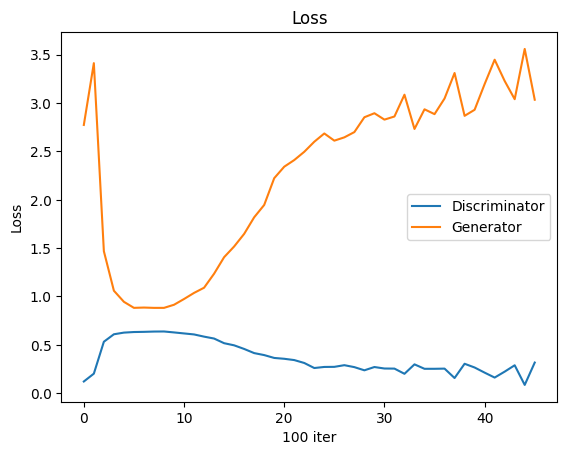

0 step

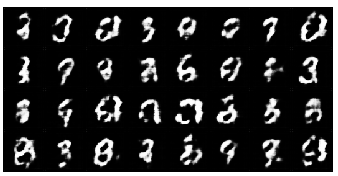

마

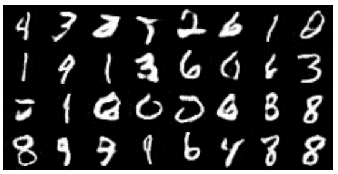

# Result

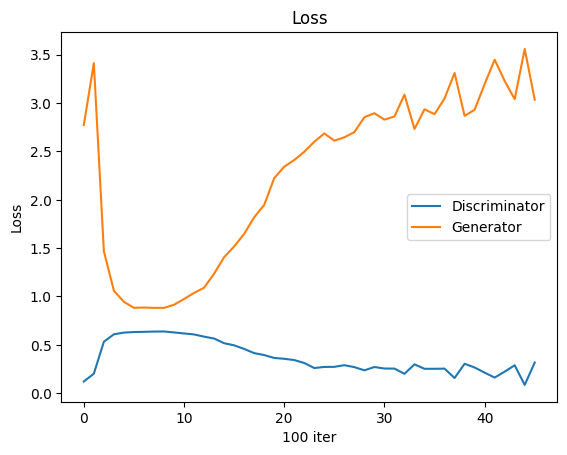

In [54]:
plt.plot(disc_loss_list, label='Discriminator')
plt.plot(gen_loss_list, label='Generator')
plt.title('Loss')
plt.xlabel('Iteration (x100)')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [56]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/DeepLerning (military)/Deep-Learning-Study/DCGAN/logs"

Output hidden; open in https://colab.research.google.com to view.